## Quick data overview

In [85]:
import pandas
import pickle
import community
import numpy as np
import networkx as nx
import fa2_modified as fa2
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from scipy.optimize import curve_fit
from matplotlib.lines import Line2D


In [2]:
# read the companies
companies = pandas.read_csv('./archive/companies.csv')
print(companies.shape)

# read the links
links = pandas.read_csv('./archive/links.csv')
print(links.shape)

# read reviews
reviews = pandas.read_csv('./archive/employee_reviews.csv')
print(reviews.shape)


(51222, 6)


/var/folders/v6/q9xwr1gn2dvdngsx947dpj280000gn/T/ipykernel_2743/76708598.py:6: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  links = pandas.read_csv('./archive/links.csv')


(373663, 10)
(67529, 17)


In [3]:
companies.head()

,index,_id,update_time,domain,name,username
0,0,{'$oid': '54dd19c08899a4c549dc71cd'},{'$date': '2015-03-31T17:14:48.439-0700'},f5.com,F5 Networks,rjurney
1,1,{'$oid': '54dd19c08899a4c549dc71ce'},{'$date': '2015-04-09T15:13:18.808-0700'},dell.com,Dell,rjurney
2,2,{'$oid': '54dd19c08899a4c549dc71d0'},{'$date': '2015-03-25T22:56:10.886-0700'},att.com,AT&T,rjurney
3,3,{'$oid': '54dd19c08899a4c549dc71d2'},{'$date': '2015-04-10T13:16:46.234-0700'},verizon.com,Verizon,rjurney
4,4,{'$oid': '54dd19c08899a4c549dc71d4'},{'$date': '2015-04-10T14:36:18.843-0700'},hp.com,Hewlett Packard,rjurney


In [4]:
links.head()

,index,_id,home_name,link_name,type,update_time,home_domain,link_domain,username,name
0,0,{'$oid': '54dd19c08899a4c549dc71cf'},F5 Networks,Dell,partnership,{'$date': '2015-02-12T21:23:12.929Z'},f5.com,dell.com,rjurney,NaN
1,1,{'$oid': '54dd19c08899a4c549dc71d1'},F5 Networks,AT&T,partnership,{'$date': '2015-02-12T21:23:12.932Z'},f5.com,att.com,rjurney,NaN
2,2,{'$oid': '54dd19c08899a4c549dc71d3'},F5 Networks,Verizon,partnership,{'$date': '2015-02-12T21:23:12.932Z'},f5.com,verizon.com,rjurney,NaN
3,3,{'$oid': '54dd19c08899a4c549dc71d5'},F5 Networks,Hewlett Packard,partnership,{'$date': '2015-02-12T21:23:12.933Z'},f5.com,hp.com,rjurney,NaN
4,4,{'$oid': '54dd19c08899a4c549dc71d7'},F5 Networks,IBM,partnership,{'$date': '2015-02-12T21:23:12.934Z'},f5.com,ibm.com,rjurney,NaN


In [9]:
# print the different values of the link type
link_list = links['type'].unique()
print(links['type'].unique())

links_filtered = ['partnership', 'customer', 'competitor', 'investment', 'supplier']

['partnership' 'customer' 'competitor' 'investment' nan 'supplier']


In [6]:
reviews.head()

,Unnamed: 0,company,location,dates,job-title,summary,pros,cons,advice-to-mgmt,overall-ratings,work-balance-stars,culture-values-stars,carrer-opportunities-stars,comp-benefit-stars,senior-mangemnet-stars,helpful-count,link
0,1,google,none,"Dec 11, 2018",Current Employee - Anonymous Employee,Best Company to work for,People are smart and friendly,Bureaucracy is slowing things down,none,5.0,4.0,5.0,5.0,4.0,5.0,0,https://www.glassdoor.com/Reviews/Google-Revie...
1,2,google,"Mountain View, CA","Jun 21, 2013",Former Employee - Program Manager,"Moving at the speed of light, burn out is inev...","1) Food, food, food. 15+ cafes on main campus ...",1) Work/life balance. What balance? All those ...,1) Don't dismiss emotional intelligence and ad...,4.0,2.0,3.0,3.0,5.0,3.0,2094,https://www.glassdoor.com/Reviews/Google-Revie...
2,3,google,"New York, NY","May 10, 2014",Current Employee - Software Engineer III,Great balance between big-company security and...,"* If you're a software engineer, you're among ...","* It *is* becoming larger, and with it comes g...",Keep the focus on the user. Everything else wi...,5.0,5.0,4.0,5.0,5.0,4.0,949,https://www.glassdoor.com/Reviews/Google-Revie...
3,4,google,"Mountain View, CA","Feb 8, 2015",Current Employee - Anonymous Employee,The best place I've worked and also the most d...,You can't find a more well-regarded company th...,I live in SF so the commute can take between 1...,Keep on NOT micromanaging - that is a huge ben...,5.0,2.0,5.0,5.0,4.0,5.0,498,https://www.glassdoor.com/Reviews/Google-Revie...
4,5,google,"Los Angeles, CA","Jul 19, 2018",Former Employee - Software Engineer,"Unique, one of a kind dream job",Google is a world of its own. At every other c...,"If you don't work in MTV (HQ), you will be giv...",Promote managers into management for their man...,5.0,5.0,5.0,5.0,5.0,5.0,49,https://www.glassdoor.com/Reviews/Google-Revie...


In [7]:
print(reviews['company'].unique())

# print number of reviews for each company
print(reviews['company'].value_counts())

['google' 'amazon' 'facebook' 'netflix' 'apple' 'microsoft']
company
amazon       26430
microsoft    17930
apple        12950
google        7819
facebook      1590
netflix        810
Name: count, dtype: int64


In [9]:
# create a directed graph where the nodes are the companies
G = nx.DiGraph()

for i, company in companies.iterrows():
    # if the node is not already in the graph, add it
    if company['name'] not in G.nodes:
        G.add_node(company['name'])
        # add an attribute
        G.nodes[company['name']]['domain'] = company['domain']

In [10]:
print(len(G.nodes))

50535


In [10]:
# create the edges between the companies
for i, link in links.iterrows():
    # if the node exist create an edge with the other node
    if link['home_name'] in G.nodes and link['link_name'] in G.nodes and link['type'] in links_filtered:
        G.add_edge(link['home_name'], link['link_name'])
        
        # add attributes to the edge
        G.edges[link['home_name'], link['link_name']]['type'] = link['type']

In [11]:
print(f"Nodes: {len(G.nodes)}")
print(f"Edges: {len(G.edges)}")

Nodes: 50535
Edges: 253657


In [16]:
# store the graph in a pickle .pkl file
with open('companies.pkl', 'wb') as f:
    pickle.dump(G, f)

In [5]:
# read the graph from the pickle file
with open('companies.pkl', 'rb') as f:
    G = pickle.load(f)

In [6]:
print(f"Nodes: {len(G.nodes)}")
print(f"Edges: {len(G.edges)}")

Nodes: 50535
Edges: 253657


In [13]:
# Check if the graph is directed
print(nx.is_directed(G))

True


In [14]:
# The average clustering coefficient in a graph is a measure of how closely nodes in the graph 
# tend to cluster together. It reflects the likelihood that two neighbors of a node are also 
# neighbors themselves, giving insight into the local density of connections in the network.

# Determine the average clustering coefficient
print(f"Average clustering coeafficient {nx.average_clustering(G)}")

# Low average clustering coefficient: Suggests sparse or loosely connected groups, often seen
# in random or less-structured networks.

Average clustering coeafficient 0.08742918560244718


In [15]:

# Check if the graph is strongly connected
print(f"Strongly connected: {nx.is_strongly_connected(G)}")

# Check if the graph is weakly connected
print(f"Weakly connected: {nx.is_weakly_connected(G)}")

# Average shortest path lenght
if nx.is_strongly_connected(G):
    print(f"Average shortest path lenght {nx.average_shortest_path_length(G)}")
else: 
    print("The graph is not strongly connected so the average shortest path length is not defined")

Strongly connected: False
Weakly connected: False
The graph is not strongly connected so the average shortest path length is not defined


In [7]:
# Make the graph undirected to calculate density
G_undirected = G.to_undirected()

# Determine the density of the graph
print(f"Density {nx.density(G)}")

# The density of a graph is the ratio of the number of edges in the graph to the total number of
# possible edges in the graph. It is a measure of how many edges the graph has compared to the
# total number of edges that it could have.

# This graph has a very low density, which suggests that it is a sparse graph

Density 9.932782041355267e-05


In [17]:
# Study of largest connected components of the undirected graph
largest_connected_component = max(nx.connected_components(G_undirected), key=len)
G_largest_connected_component = G_undirected.subgraph(largest_connected_component)

print(f"Nodes in the largest connected component: {len(G_largest_connected_component.nodes)}")
print(f"Edges in the largest connected component: {len(G_largest_connected_component.edges)}")

# Determine the average clustering coefficient of the largest connected component
print(f"Average clustering coefficient of the largest connected component: {nx.average_clustering(G_largest_connected_component)}")

# Determine the density of the largest connected component
print(f"Density of the largest connected component: {nx.density(G_largest_connected_component)}")


Nodes in the largest connected component: 49758
Edges in the largest connected component: 190727
Average clustering coefficient of the largest connected component: 0.10588432899483778
Density of the largest connected component: 0.00015407247889076295


In [11]:
# HUBS

# The degree of a node in a network is the number of connections it has to other nodes.
# The in-degree of a node is the number of incoming connections it has from other nodes.
# The out-degree of a node is the number of outgoing connections it has to other nodes.

# The equality holds because every edge contributes exactly once to the in-degree of one node
# and once to the out-degree of another node. This is intrinsic to how directed edges are defined,
# making the sums (and therefore the averages) of in-degrees and out-degrees equal.

# Calculate average degree of the graph
degrees = [val for (node, val) in G.degree()]
print(f"Average degree: {sum(degrees)/len(G)}")

# Calculate the average in-degree of the graph
in_degrees = [val for (node, val) in G.in_degree()]
print(f"Average in-degree: {sum(in_degrees)/len(G)}")

# Calculate the average out-degree of the graph
out_degrees = [val for (node, val) in G.out_degree()]
print(f"Average out-degree: {sum(out_degrees)/len(G)}")

Average degree: 10.038864153556942
Average in-degree: 5.019432076778471
Average out-degree: 5.019432076778471


In [12]:
# calculate the degree centrality of the graph for in and out edges
in_degree_centrality = nx.in_degree_centrality(G)

# print the name of the five most central nodes
print("Most central in-degree nodes:")
print(sorted(in_degree_centrality, key=in_degree_centrality.get, reverse=True)[:10])

out_degree_centrality = nx.out_degree_centrality(G)
print("Most central out-degree nodes:")
print(sorted(out_degree_centrality, key=out_degree_centrality.get, reverse=True)[:10])

Most central in-degree nodes:
['Microsoft', 'Google', 'IBM', 'Facebook', 'Oracle', 'Cisco', 'SAP', 'Intel', 'Adobe', 'Dell']
Most central out-degree nodes:
['Cisco', 'Microsoft', 'Rackspace', 'Google', 'Oracle', 'IBM', 'Amazon Web Services', 'Facebook', 'SAP', 'NetApp']


In [13]:
# Measures a node's influence based on its connections to other highly influential nodes.

# Calculate the PageRank of the graph
pagerank_centrality = nx.pagerank(G)
print("Most central PageRank nodes:")
print(sorted(pagerank_centrality, key=pagerank_centrality.get, reverse=True)[:10])

# Compare with eigenvector centrality
eigenvector_centrality = nx.eigenvector_centrality(G)
print("Most central eigenvector centrality nodes:")
print(sorted(eigenvector_centrality, key=eigenvector_centrality.get, reverse=True)[:10])

Most central PageRank nodes:
['Microsoft', 'Google', 'Facebook', 'IBM', 'Oracle', 'SAP', 'Cisco', 'Intel', 'Adobe', 'SUSE']
Most central eigenvector centrality nodes:
['Microsoft', 'Google', 'IBM', 'Facebook', 'Oracle', 'Cisco', 'SAP', 'Intel', 'Samsung', 'Adobe']


In [14]:
# Print the total count per type of edges for the 5 more central nodes
for node in sorted(pagerank_centrality, key=pagerank_centrality.get, reverse=True)[:5]:
    print(f"Node {node} has type of edges:")
    edges = {}
    for edge in G.edges(node):
        if G.edges[edge]['type'] not in edges:
            edges[G.edges[edge]['type']] = 1
        else:
            edges[G.edges[edge]['type']] += 1

    print(edges)
    
    

Node Microsoft has type of edges:
{'partnership': 1639, 'supplier': 656, 'customer': 683, 'investment': 500, 'competitor': 95}
Node Google has type of edges:
{'customer': 571, 'partnership': 491, 'supplier': 707, 'investment': 454, 'competitor': 75}
Node Facebook has type of edges:
{'customer': 472, 'supplier': 546, 'investment': 356, 'partnership': 321, 'competitor': 93}
Node IBM has type of edges:
{'partnership': 528, 'customer': 519, 'supplier': 464, 'investment': 458, 'competitor': 81}
Node Oracle has type of edges:
{'partnership': 1000, 'customer': 434, 'supplier': 333, 'investment': 390, 'competitor': 64}


In [17]:
# print the pagerank of the 5 most central nodes
sorted_nodes = sorted(pagerank_centrality, key=pagerank_centrality.get, reverse=True)

num_top_nodes = int(len(sorted_nodes) * 0.001)
top_nodes = [node for node in sorted_nodes[:num_top_nodes]]

# Create a subgraph with the top nodes
G_top = G.subgraph(top_nodes)

# # Create a layout for our nodes
# #layout = fa2.force_atlas2_layout(G_top, iterations=1000)
# plt.figure(figsize=(10, 10))

# pos = nx.spring_layout(G_top, seed=42)  # Spring layout for visualization
# nx.draw(
#     G_top, pos, with_labels=True, node_color='blue', node_size=10,
#     edge_color='gray', font_size=8, alpha=0.8
# )

# # Draw the graph
# # nx.draw_networkx_nodes(G_top, layout, node_size=10, node_color='blue', alpha=0.5)
# # nx.draw_networkx_edges(G_top, layout, edge_color='green', alpha=0.2)
# # plt.axis('off')
# plt.show()

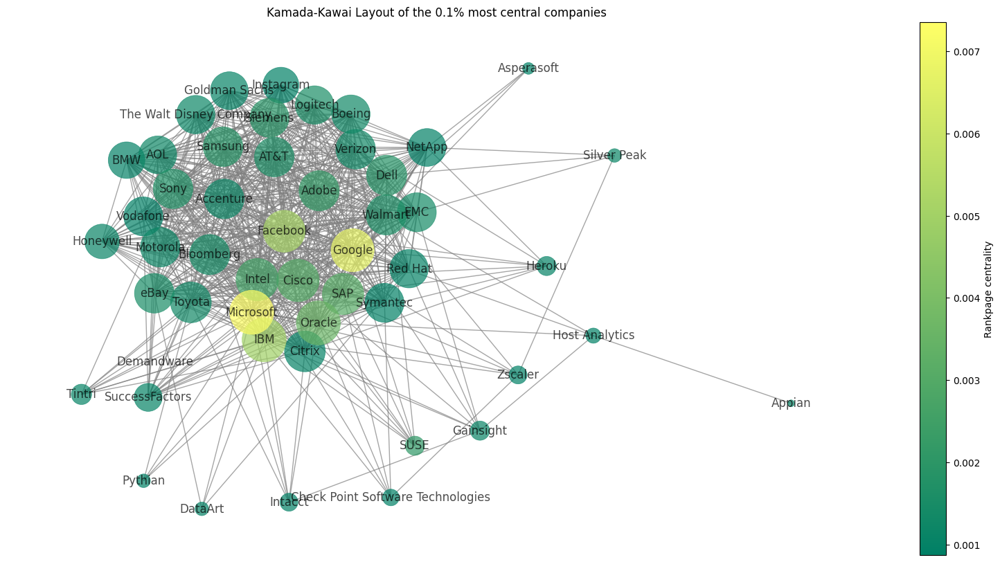

In [23]:
# define the undirected graph
undir_g = G_top.to_undirected()

# plot the network
degrees = dict(undir_g.degree())

# Normalize node sizes based on degree (you can tweak scaling factor if necessary)
node_sizes = [degrees[node] * 50 for node in undir_g.nodes()]

# Get pagerank values for nodes
pagerank_values = [pagerank_centrality[node] for node in undir_g.nodes()]
# content_lengths = [nb.largest_c_subgraph.nodes[node].get('len_content', 0) for node in undir_g.nodes()]

# Normalize content lengths for color mapping
norm = plt.Normalize(vmin=min(pagerank_values), vmax=max(pagerank_values))
cmap = plt.get_cmap('summer')  # Choosing a simple sequential colormap

# Draw the network using Kamada-Kawai layout
pos = nx.kamada_kawai_layout(undir_g)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(20, 10))

# Create the scalar mappable (for the color bar)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(pagerank_values)

# Draw the graph with customized node sizes and colors
nx.draw(
    undir_g, 
    pos, 
    ax=ax,
    with_labels=True,  # Remove labels for clarity
    node_size=node_sizes,  # Size of nodes based on degree
    node_color=pagerank_values,  # Color based on pagerank_values attribute
    cmap=cmap,  # Colormap for node colors
    edge_color='gray',  # Color of edges
    alpha=0.7,  # Transparency of edges
    linewidths=0.5  # Width of edges
)

# Add the color bar to the specific axis
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('Rankpage centrality', color='black')  # Color of the color bar label

# Style adjustments
plt.title("Kamada-Kawai Layout of the 0.1% most central companies", color='black')
ax.tick_params(colors='black')  # White tick labels
plt.show()


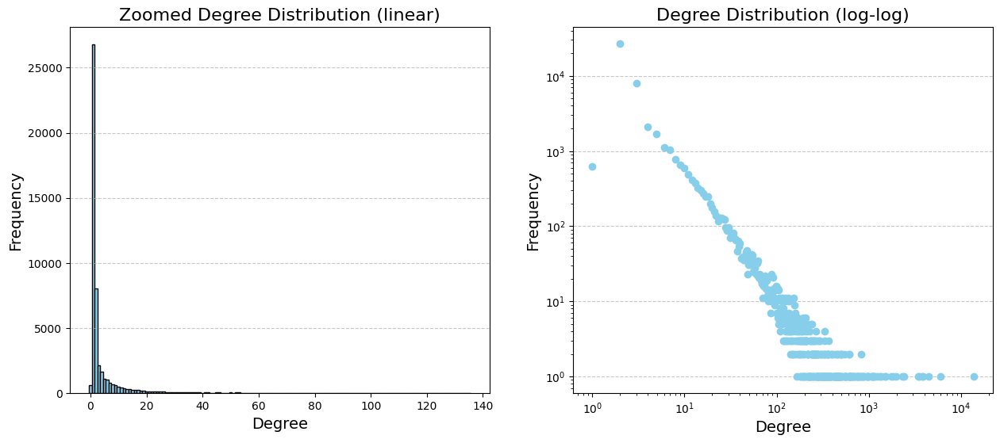

In [46]:
# Plot the degree distribution
plt.figure(figsize=(15, 6))

# Casted degree distribution
plt.subplot(1, 2, 1)
plt.hist(degrees, bins=range(min(degrees), int(max(degrees)/100) + 2), align='left', color='skyblue', edgecolor='black')
plt.title("Zoomed Degree Distribution (linear)", fontsize=16)
plt.xlabel("Degree", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Original degree distribution
plt.subplot(1, 2, 2)
hist, bins = np.histogram(degrees, bins=len(range(min(degrees), max(degrees) + 2)))
plt.loglog(bins[1:], hist, 'o', color='skyblue')
# plt.hist(degrees, bins=range(min(degrees), max(degrees) + 2), align='left', color='skyblue', edgecolor='black')
plt.title("Degree Distribution (log-log)", fontsize=16)
plt.xlabel("Degree", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()
# Looks like a power-law distribution

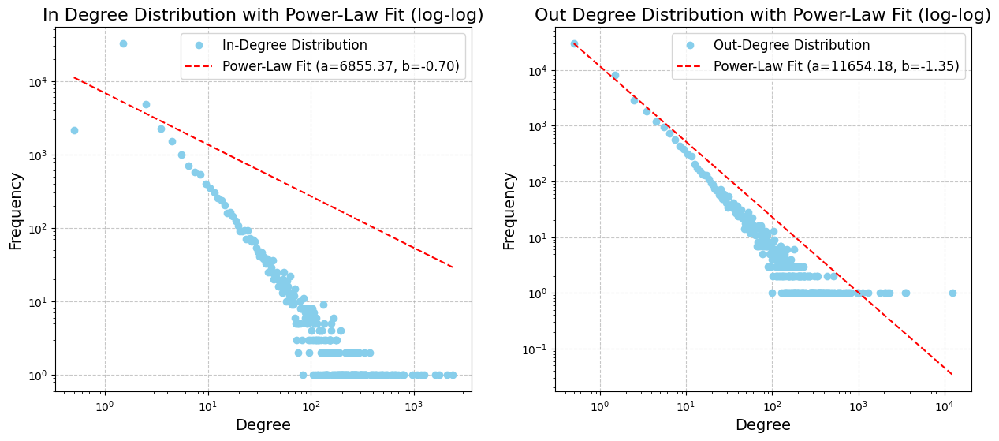

In [ ]:
# Fit the power-law function
def power_law(x, a, b):
    return a * np.power(x, b)

def compute_hist_data(degrees):
    # Compute histogram data
    hist, bins = np.histogram(degrees, bins=len(range(min(degrees), max(degrees) + 2)))
    bin_centers = (bins[:-1] + bins[1:]) / 2  # Bin centers for fitting

    # Filter bins with nonzero frequency for fitting
    nonzero_mask = hist > 0
    xdata = bin_centers[nonzero_mask]
    ydata = hist[nonzero_mask]

    # Fit the power-law curve
    params, _ = curve_fit(power_law, xdata, ydata)
    a, b = params

    # Step 2: Generate the power-law curve
    x_fit = np.linspace(min(xdata), max(xdata), 100)
    y_fit = power_law(x_fit, a, b)

    return bin_centers, hist, x_fit, y_fit, a, b

# Compute histogram data and power-law fit for in-degrees
bin_centers_in, hist_in, x_fit_in, y_fit_in, a_in, b_in = compute_hist_data(in_degrees)

# Compute histogram data and power-law fit for out-degrees
bin_centers_out, hist_out, x_fit_out, y_fit_out, a_out, b_out = compute_hist_data(out_degrees)

# Plot the degree distribution and power-law curve
plt.figure(figsize=(15, 6))

# Plot the in-degree distribution and power-law curve
plt.subplot(1, 2, 1)
plt.loglog(bin_centers_in, hist_in, 'o', color='skyblue', label='In-Degree Distribution')

# Plot the power-law fit
plt.loglog(x_fit_in, y_fit_in, '--', color='red', label=f'Power-Law Fit (a={a_in:.2f}, b={b_in:.2f})')

# Customize plot
plt.title("In Degree Distribution with Power-Law Fit (log-log)", fontsize=16)
plt.xlabel("Degree", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.legend(fontsize=12)
plt.grid(axis='both', linestyle='--', alpha=0.7)

# Plot the out-degree distribution and power-law curve
plt.subplot(1, 2, 2)
plt.loglog(bin_centers_out, hist_out, 'o', color='skyblue', label='Out-Degree Distribution')

# Plot the power-law fit
plt.loglog(x_fit_out, y_fit_out, '--', color='red', label=f'Power-Law Fit (a={a_out:.2f}, b={b_out:.2f})')

# Customize plot
plt.title("Out Degree Distribution with Power-Law Fit (log-log)", fontsize=16)
plt.xlabel("Degree", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.legend(fontsize=12)
plt.grid(axis='both', linestyle='--', alpha=0.7)

plt.show()

# considering there is a 

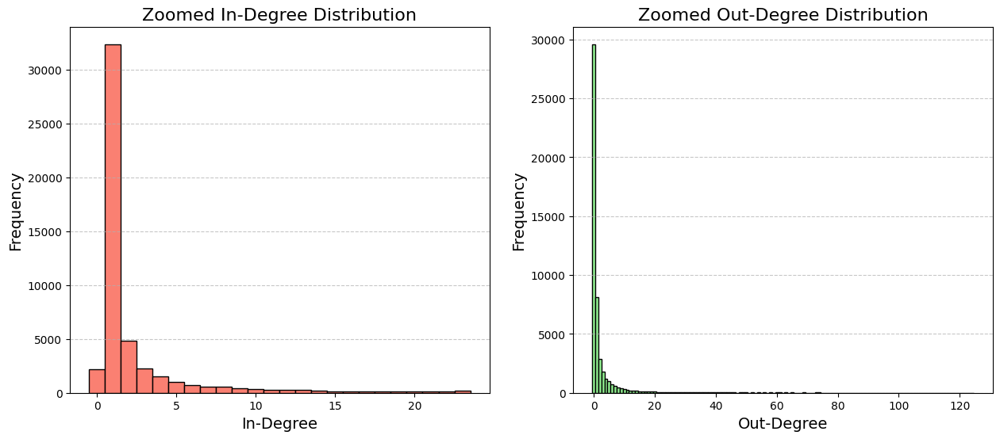

In [25]:
plt.figure(figsize=(15, 6))

# Plot in-degree distribution
plt.subplot(1, 2, 1)
plt.hist(in_degrees, bins=range(min(in_degrees), int(max(in_degrees)/100) + 2), align='left', color='salmon', edgecolor='black')
plt.title("Zoomed In-Degree Distribution", fontsize=16)
plt.xlabel("In-Degree", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Plot out-degree distribution
plt.subplot(1, 2, 2)
plt.hist(out_degrees, bins=range(min(out_degrees), int(max(out_degrees)/100) + 2), align='left', color='lightgreen', edgecolor='black')
plt.title("Zoomed Out-Degree Distribution", fontsize=16)
plt.xlabel("Out-Degree", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [26]:
def second_degree(graph, degree_type="in"):
    second_degrees = []
    for node in graph.nodes():
        neighbors = graph.predecessors(node) if degree_type == "in" else graph.successors(node)
        second_deg = sum(graph.in_degree(n) for n in neighbors) if degree_type == "in" else sum(graph.out_degree(n) for n in neighbors)
        second_degrees.append(second_deg)
    return np.mean(second_degrees)

second_in_degree = second_degree(G, degree_type="in")
second_out_degree = second_degree(G, degree_type="out")

print(f"Average Second In-Degree: {second_in_degree}")
print(f"Average Second Out-Degree: {second_out_degree}")

Average Second In-Degree: 1244.0160680716335
Average Second Out-Degree: 1244.0160680716335


### COMMUNITITES

In [ ]:
# do community detection based on the Louvain method
# Compute the best partition
partition = community.best_partition(G_undirected)

# Compute modularity
modularity = community.modularity(partition, G_undirected)
print(f"Modularity: {modularity}")

# Create a dictionary of communities
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []

    communities[community_id].append(node)
    
# Print the number of communities
print(f"Number of communities: {len(communities)}")

Modularity: 0.4224891946398339
Number of communities: 730


In [74]:
# Create a meta-graph
meta_graph = nx.Graph()
for com, nodes in communities.items():
    meta_graph.add_node(com, size=len(nodes))  # Add community node with size

    # measure the density of the community
    subgraph = G_undirected.subgraph(nodes)
    density = nx.density(subgraph)

    # add the density as a node attribute of the community node
    meta_graph.nodes[com]['density'] = density

    # Calculate internal and external degrees
    internal_edges = subgraph.number_of_edges()  # Edges within the community
    external_edges = sum(1 for node in nodes for neighbor in G_undirected.neighbors(node) if neighbor not in nodes)

    # Compute average internal and external degrees
    meta_graph.nodes[com]['avg_internal_degree'] = internal_edges / len(nodes)
    meta_graph.nodes[com]['avg_external_degree'] = external_edges / len(nodes)


print(f"Meta-graph nodes: {len(meta_graph.nodes)}")

# Calculate inter-community edges by aggregating connections between nodes in different communities
for u, v, data in G_undirected.edges(data=True):
    com_u = partition[u]
    com_v = partition[v]
    if com_u != com_v:  # Only inter-community edges
        weight = data.get('weight', 1)  # Use edge weight if it exists, default to 1
        if meta_graph.has_edge(com_u, com_v):
            meta_graph[com_u][com_v]['weight'] += weight
        else:
            meta_graph.add_edge(com_u, com_v, weight=weight)


print(f"Meta-graph edges: {len(meta_graph.edges)}")

# Extract node sizes and edge weights
node_sizes = [meta_graph.nodes[com]['size'] * 100 for com in meta_graph.nodes()]
edge_weights = [meta_graph[u][v]['weight'] for u, v in meta_graph.edges()]

Meta-graph nodes: 730
Meta-graph edges: 305


In [75]:
# create a copy of the meta_graph and remove the unconected nodes
meta_graph_copy = meta_graph.copy()
meta_graph_copy.remove_nodes_from(list(nx.isolates(meta_graph_copy)))
node_sizes = [meta_graph_copy.nodes[com]['size'] for com in  meta_graph_copy.nodes()]


print(f"Meta-graph nodes: {len(meta_graph_copy.nodes)}")

Meta-graph nodes: 81


Most central PageRank nodes:
[1, 0, 2, 6, 4]


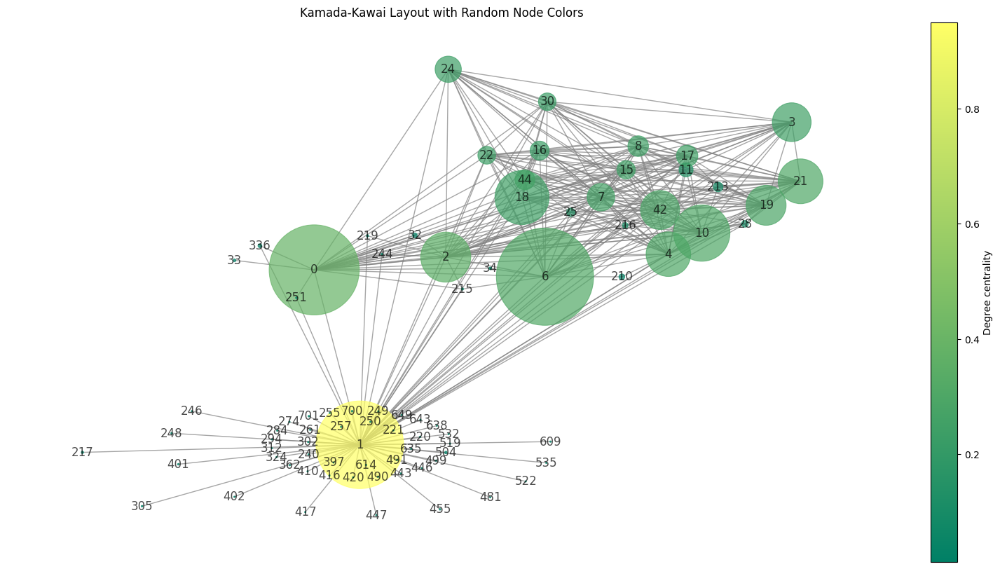

In [76]:
# Calculate centrality for the meta-graph since it is undirected
centrality_meta = nx.degree_centrality(meta_graph_copy)
print("Most central PageRank nodes:")
print(sorted(centrality_meta, key=centrality_meta.get, reverse=True)[:5])
# Get pagerank values for nodes
centrality_values = [centrality_meta[node] for node in meta_graph_copy.nodes()]

# Normalize content lengths for color mapping
norm = plt.Normalize(vmin=min(centrality_values), vmax=max(centrality_values))
cmap = plt.get_cmap('summer')  # Choosing a simple sequential colormap

# Draw the network using Kamada-Kawai layout
pos = nx.kamada_kawai_layout(meta_graph_copy)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(20, 10))

# Create the scalar mappable (for the color bar)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(centrality_values)

# Draw the graph with customized node sizes and random colors
nx.draw(
    meta_graph_copy, 
    pos, 
    ax=ax,
    with_labels=True,  # Remove labels for clarity
    node_size=node_sizes,  # Size of nodes based on degree
    node_color=centrality_values,  # Assign random colors to nodes
    cmap=cmap,  # Colormap for nodes (optional if random colors are used)
    edge_color='gray',  # Color of edges
    alpha=0.7,  # Transparency of edges
    linewidths=0.8  # Width of edges
)

# Add the color bar to the specific axis
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('Degree centrality', color='black')  # Color of the color bar label

# Optional: Add a legend or other stylistic elements
plt.title("Kamada-Kawai Layout with Random Node Colors", color='black')
ax.tick_params(colors='black')  # Black tick labels
plt.show()

In [84]:
# Five more influential communities information
data = []
for c in sorted(centrality_meta, key=centrality_meta.get, reverse=True)[:5]:
    data.append([c, meta_graph_copy.nodes[c]['size'], centrality_meta[c], np.mean([meta_graph_copy.degree(n) for n in meta_graph_copy.neighbors(c)]), meta_graph_copy.nodes[c]['density'], meta_graph_copy.nodes[c]['avg_internal_degree'], meta_graph_copy.nodes[c]['avg_external_degree']])

community_metrics= pandas.DataFrame(data, columns=['Community', 'Size', 'Centrality', 'Average degree', 'Density', 'Average internal degree', 'Average external degree'])
community_metrics.head()

,Community,Size,Centrality,Average degree,Density,Average internal degree,Average external degree
0,1,8105,0.9500,6.934211,0.002383,9.657742,4.766564
1,0,8561,0.3875,17.032258,0.000463,1.980960,2.267726
2,2,2642,0.3500,18.785714,0.001587,2.095382,4.951173
3,6,9970,0.3125,20.400000,0.000205,1.020160,0.304915
4,4,2099,0.3000,21.375000,0.001023,1.073368,1.895188


In [ ]:
print('here')

# Draw the meta-graph
pos = nx.spring_layout(meta_graph)  # Layout for meta-graph
plt.figure(figsize=(10, 10))
nx.draw_networkx(
    meta_graph,
    pos,
    node_size=node_sizes,
    edge_color=edge_weights,
    width=2,
    edge_cmap=plt.cm.Blues,
    node_color=range(len(meta_graph.nodes())),
    cmap=plt.cm.tab10,
    with_labels=True
)

plt.title("Meta-Graph of Communities")
plt.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.Blues), label="Edge Weight")
plt.show()

### ROBUSTNESS

In [30]:
import random

In [ ]:
# THIS CODE DOES NOT WORK
# Function to calculate largest connected component size
def lcc_size(graph):
    return len(max(nx.connected_components(graph), key=len)) if nx.is_connected(graph) else 0

# Simulate random failures
def simulate_random_failures(graph, fraction=0.1):
    G_copy = graph.copy()
    nodes = list(G_copy.nodes())
    random.shuffle(nodes)
    num_remove = int(fraction * len(nodes))
    removed = nodes[:num_remove]
    G_copy.remove_nodes_from(removed)
    len_connected = lcc_size(G_copy)
    print(f"Remaining LCC size after random failure: {len_connected}")
    return len(G_copy) / len(graph)

print(len(G_connected_lcc.nodes))

# Measure robustness with 10% random node removal
random_robustness = simulate_random_failures(G_connected_lcc, fraction=0.1)
print(f"Remaining LCC size after random failure: {random_robustness:.4f}")

49758
Remaining LCC size after random failure: 0
Remaining LCC size after random failure: 0.9000


In [37]:
def robustness_index(graph, strategy="random"):
    G_copy = graph.copy()
    nodes = list(G_copy.nodes())
    if strategy == "random":
        random.shuffle(nodes)
    elif strategy == "targeted":
        nodes = sorted(G_copy.degree, key=lambda x: x[1], reverse=True)
    
    lcc_sizes = []
    for i, node in enumerate(nodes):
        G_copy.remove_node(node)
        lcc_sizes.append(lcc_size(G_copy) / len(graph))
    
    # Compute robustness index
    robustness = sum(lcc_sizes) / len(graph)
    return robustness

# Compute for random failures and targeted attacks
random_robustness = robustness_index(G_connected_lcc, strategy="random")
targeted_robustness = robustness_index(G_connected_lcc, strategy="targeted")

print(f"Robustness (Random Failures): {random_robustness:.4f}")
print(f"Robustness (Targeted Attacks): {targeted_robustness:.4f}")


NetworkXPointlessConcept: Connectivity is undefined for the null graph.

## GOURPING BY EDGE TYPE

In [86]:
# create one subgraph for each type of link
G_subgraphs_link = {}

# create a subgraph for each type of link from original data
for link_type in links_filtered:
    # create a directed graph where the nodes are the companies
    subgraph = nx.DiGraph()

    # filter the linked list only to keep the link_type
    links_fil = links[links['type'] == link_type]

    # create a directed graph where the nodes are the companies
    for _, link in links_fil.iterrows():
        # if the node exist create an edge with the other node
        if link['home_name'] in G.nodes and link['link_name'] in G.nodes:
            subgraph.add_edge(link['home_name'], link['link_name'])

            # add attributes to the edge
            subgraph.edges[link['home_name'], link['link_name']]['type'] = link['type']
    
    G_subgraphs_link[link_type] = subgraph

# print the number of nodes and edges in each subgraph
for link_type, G_subgraph in G_subgraphs_link.items():
    print(f"Subgraph {link_type}:")
    print(f"Nodes: {len(G_subgraph.nodes)}")
    print(f"Edges: {len(G_subgraph.edges)}")
    print()


Subgraph partnership:
Nodes: 39723
Edges: 90962

Subgraph customer:
Nodes: 16781
Edges: 56791

Subgraph competitor:
Nodes: 7504
Edges: 23902

Subgraph investment:
Nodes: 10477
Edges: 49769

Subgraph supplier:
Nodes: 16111
Edges: 55825



In [87]:
# Analyse the subgraphs of the different types of links
def basic_statistics(graph):
        print(f"Nodes: {len(graph.nodes)}")
        print(f"Edges: {len(graph.edges)}")
        print(f"Average clustering coefficient: {nx.average_clustering(graph)}")
        print(f"Density: {nx.density(graph)}")

        if nx.is_strongly_connected(graph):
            print(f"Average shortest path length: {nx.average_shortest_path_length(graph)}")
        else:
            print("The graph is not strongly connected so the average shortest path length is not defined")
        print()

In [88]:
# print the basic statistics of each subgraph
for link_type, G_subgraph in G_subgraphs_link.items():
    print(f"Subgraph {link_type}:")
    basic_statistics(G_subgraph)

Subgraph partnership:
Nodes: 39723
Edges: 90962
Average clustering coefficient: 0.05041446455957246
Density: 5.764834626153365e-05
The graph is not strongly connected so the average shortest path length is not defined

Subgraph customer:
Nodes: 16781
Edges: 56791
Average clustering coefficient: 0.05181558822640423
Density: 0.00020168319937860366
The graph is not strongly connected so the average shortest path length is not defined

Subgraph competitor:
Nodes: 7504
Edges: 23902
Average clustering coefficient: 0.18226135031561894
Density: 0.00042452812762599297
The graph is not strongly connected so the average shortest path length is not defined

Subgraph investment:
Nodes: 10477
Edges: 49769
Average clustering coefficient: 0.06524292473055439
Density: 0.00045344694571424897
The graph is not strongly connected so the average shortest path length is not defined

Subgraph supplier:
Nodes: 16111
Edges: 55825
Average clustering coefficient: 0.05414025514566784
Density: 0.0002150852822294555

In [89]:
# plot the subgraphs
def plot_subgraph(graph, title):
    # Create the layout
    pos = nx.spring_layout(graph, seed=42)

    # Draw the graph
    plt.figure(figsize=(15, 10))
    nx.draw(graph, pos, with_labels=True, node_size=10, node_color='skyblue', font_size=10, font_weight='bold', edge_color='gray', width=2, edgecolors='black', linewidths=1)

    # Set the title
    plt.title(title, fontsize=16)

    # Show the plot
    plt.show()

In [90]:
def centrality_measures(graph):
    # Calculate the in-degree centrality of the graph
    in_degree_centrality = nx.in_degree_centrality(graph)

    # Print the name of the five most central nodes
    print("Most central in-degree nodes:")
    print(sorted(in_degree_centrality, key=in_degree_centrality.get, reverse=True)[:5])

    # Calculate the out-degree centrality of the graph
    out_degree_centrality = nx.out_degree_centrality(graph)

    # Print the name of the five most central nodes
    print("Most central out-degree nodes:")
    print(sorted(out_degree_centrality, key=out_degree_centrality.get, reverse=True)[:5])

    # Calculate the PageRank of the graph
    pagerank_centrality = nx.pagerank(graph)

    # Print the name of the five most central nodes
    print("Most central PageRank nodes:")
    print(sorted(pagerank_centrality, key=pagerank_centrality.get, reverse=True)[:5])

    # Compare with eigenvector centrality
    eigenvector_centrality = nx.eigenvector_centrality(graph)
    print("Most central eigenvector centrality nodes:")
    print(sorted(eigenvector_centrality, key=eigenvector_centrality.get, reverse=True)[:5])


In [91]:
# sort the subgraphs by number of nodes, from smallest to biggest
sorted_subgraphs = sorted(G_subgraphs_link.items(), key=lambda x: len(x[1].nodes))
print(sorted_subgraphs)

[('competitor', <networkx.classes.digraph.DiGraph object at 0x15930ce90>), ('investment', <networkx.classes.digraph.DiGraph object at 0x16b3725d0>), ('supplier', <networkx.classes.digraph.DiGraph object at 0x159319b50>), ('customer', <networkx.classes.digraph.DiGraph object at 0x15936c050>), ('partnership', <networkx.classes.digraph.DiGraph object at 0x16adb08f0>)]


In [25]:
import community.community_louvain as community_louvain

Subgraph competitor:
Nodes: 7504
Edges: 23902
Modularity: 0.6778131065902164
Number of communities: 408
Meta-graph edges: 410



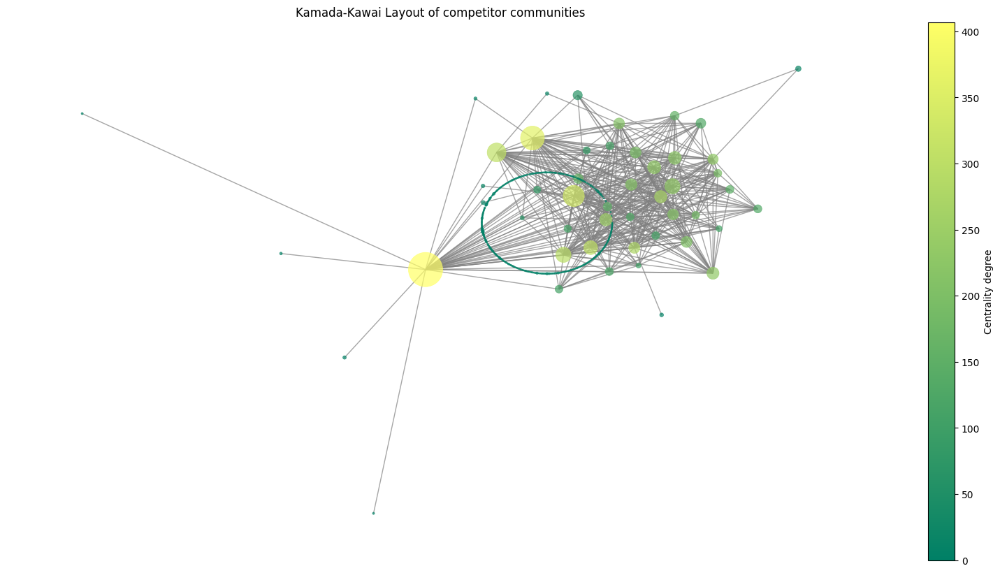

Subgraph investment:
Nodes: 10477
Edges: 49769
Modularity: 0.31067917855471133
Number of communities: 119
Meta-graph edges: 174



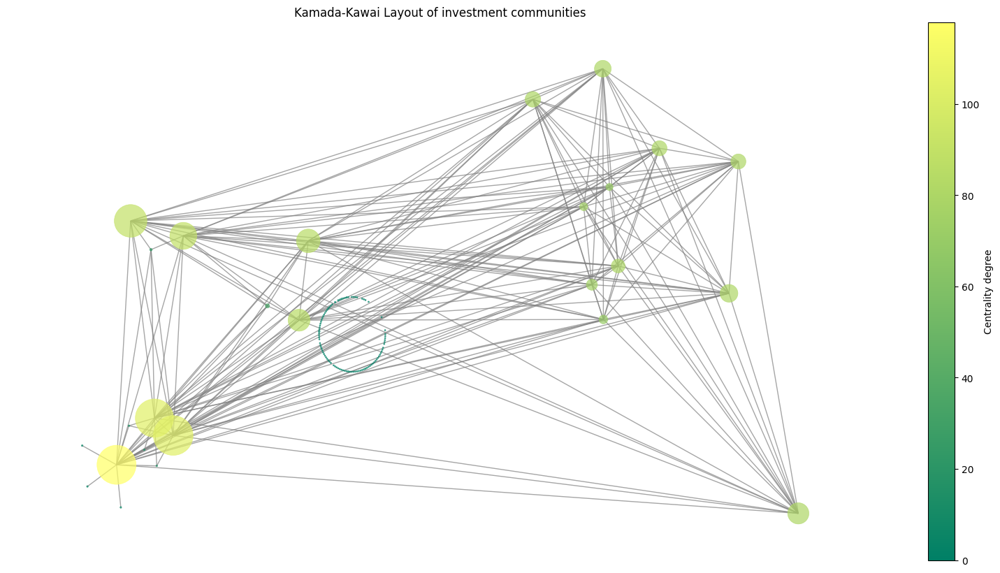

Subgraph supplier:
Nodes: 16111
Edges: 55825
Modularity: 0.3814689975000338
Number of communities: 122
Meta-graph edges: 403



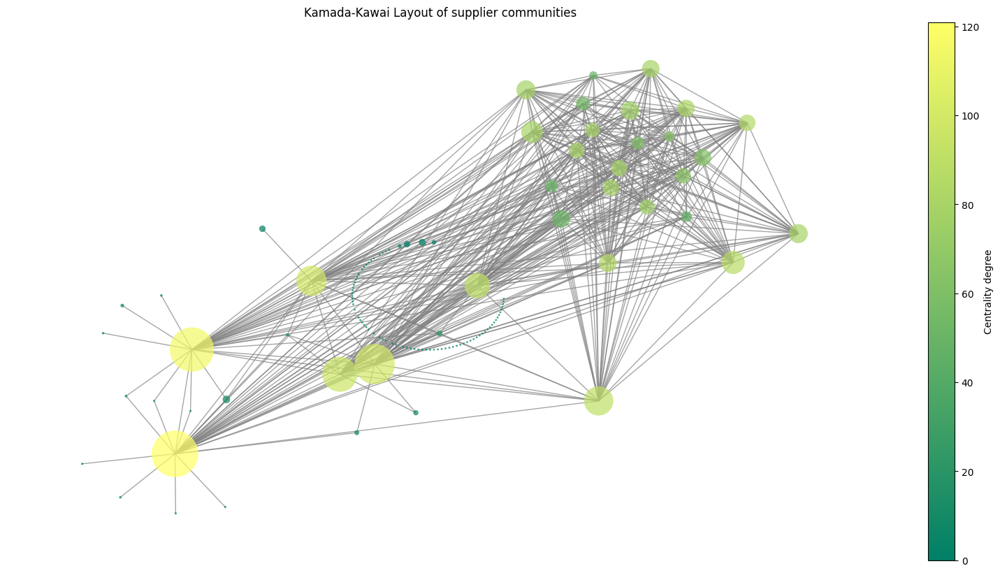

Subgraph customer:
Nodes: 16781
Edges: 56791
Modularity: 0.38279919217490044
Number of communities: 136
Meta-graph edges: 538



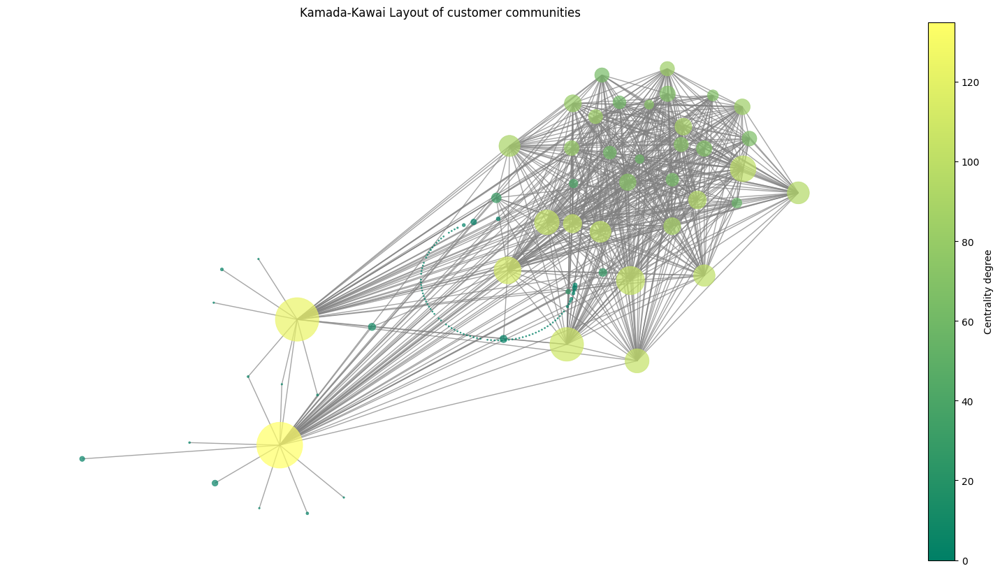

Subgraph partnership:
Nodes: 39723
Edges: 90962
Modularity: 0.5574809988878435
Number of communities: 221
Meta-graph edges: 356



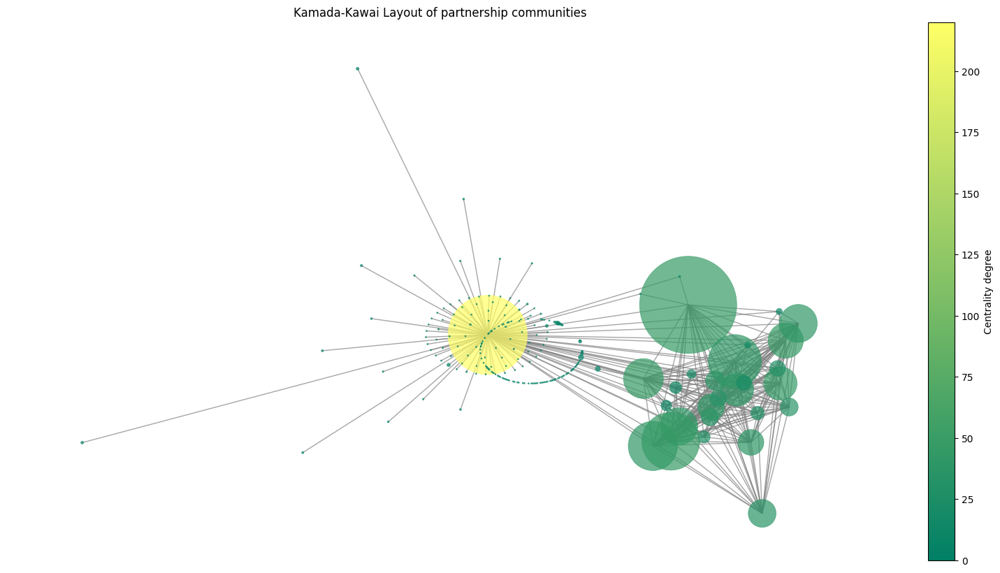

In [94]:
# for each subgraph compute communities and plot the graph
for link_type, subgraph in sorted_subgraphs:
    print(f"Subgraph {link_type}:")
    print(f"Nodes: {len(subgraph.nodes)}")
    print(f"Edges: {len(subgraph.edges)}")
    # Compute communities
    partition = community_louvain.best_partition(subgraph.to_undirected())
    modularity = community.modularity(partition, subgraph.to_undirected())
    print(f"Modularity: {modularity}")

    # Create a dictionary of communities
    communities = {}
    for node, community_id in partition.items():
        if community_id not in communities:
            communities[community_id] = []
        communities[community_id].append(node)

    # Print the number of communities
    print(f"Number of communities: {len(communities)}")

    # Create a meta-graph
    meta_graph = nx.Graph()
    for com, nodes in communities.items():
        meta_graph.add_node(com, size=len(nodes))  # Add community node with size

    # Calculate inter-community edges by aggregating connections between nodes in different communities
    for u, v, data in subgraph.edges(data=True):
        com_u = partition[u]
        com_v = partition[v]
        if com_u != com_v:  # Only inter-community edges
            weight = data.get('weight', 1)  # Use edge weight if it exists, default to 1
            if meta_graph.has_edge(com_u, com_v):
                meta_graph[com_u][com_v]['weight'] += weight
            else:
                meta_graph.add_edge(com_u, com_v, weight=weight)

    print(f"Meta-graph edges: {len(meta_graph.edges)}")

    print()

    # Extract node sizes and edge weights
    node_sizes = [meta_graph.nodes[com]['size'] for com in meta_graph.nodes()]
    edge_weights = [meta_graph[u][v]['weight'] for u, v in meta_graph.edges()]

    # Get centrality degree for nodes
    centrality = nx.degree_centrality(meta_graph)
    centrality_values_meta = [centrality[node] for node in meta_graph.nodes()]

    # Normalize content lengths for color mapping
    norm = plt.Normalize(vmin=min(centrality), vmax=max(centrality))
    cmap = plt.get_cmap('summer')  # Choosing a simple sequential colormap

    # Draw the network using Kamada-Kawai layout
    pos = nx.kamada_kawai_layout(meta_graph)

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(20, 10))

    # Create the scalar mappable (for the color bar)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array(centrality_values_meta)

    # Draw the graph with customized node sizes and colors
    nx.draw(
        meta_graph, 
        pos, 
        ax=ax,
        with_labels=False,  # Remove labels for clarity
        node_size=node_sizes,  # Size of nodes based on degree
        node_color=centrality_values_meta,  # Color based on pagerank_values attribute
        cmap=cmap,  # Colormap for node colors
        edge_color='gray',  # Color of edges
        alpha=0.7,  # Transparency of edges
        linewidths=0.5  # Width of edges
    )

    # Add the color bar to the specific axis
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label('Centrality degree', color='black')  # Color of the color bar label

    # Style adjustments
    plt.title(f"Kamada-Kawai Layout of {link_type} communities", color='black')
    ax.tick_params(colors='black')  # White tick labels
    plt.show()
    


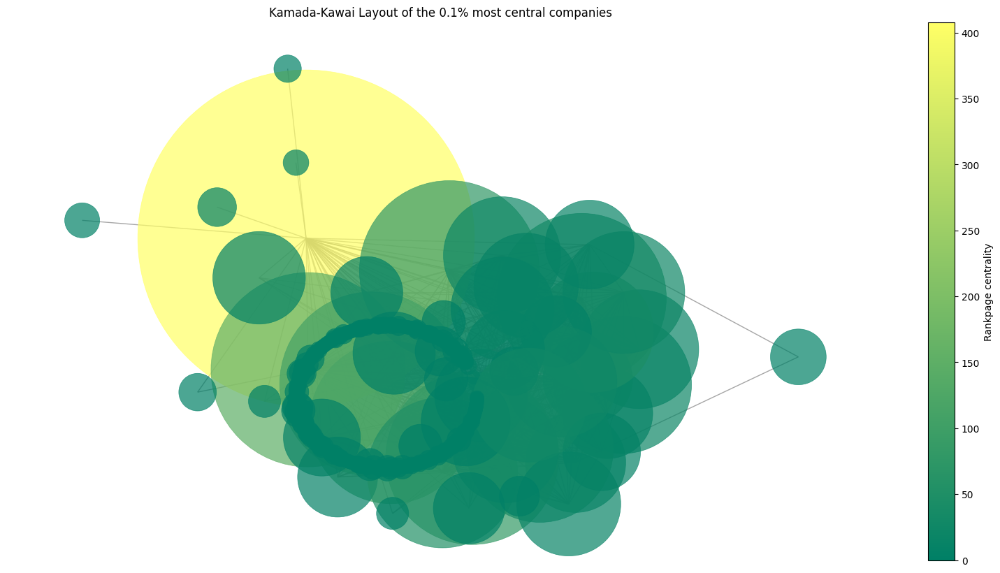

In [ ]:
# Get pagerank values for nodes
pagerank_centrality_meta = nx.pagerank(meta_graph)
pagerank_values_meta = [pagerank_centrality_meta[node] for node in meta_graph.nodes()]

# Normalize content lengths for color mapping
norm = plt.Normalize(vmin=min(pagerank_centrality_meta), vmax=max(pagerank_centrality_meta))
cmap = plt.get_cmap('summer')  # Choosing a simple sequential colormap

# Draw the network using Kamada-Kawai layout
pos = nx.kamada_kawai_layout(meta_graph)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(20, 10))

# Create the scalar mappable (for the color bar)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(pagerank_values_meta)

# Draw the graph with customized node sizes and colors
nx.draw(
    meta_graph, 
    pos, 
    ax=ax,
    with_labels=False,  # Remove labels for clarity
    node_size=node_sizes,  # Size of nodes based on degree
    node_color=pagerank_values_meta,  # Color based on pagerank_values attribute
    cmap=cmap,  # Colormap for node colors
    edge_color='gray',  # Color of edges
    alpha=0.7,  # Transparency of edges
    linewidths=0.5  # Width of edges
)

# Add the color bar to the specific axis
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('Rankpage centrality', color='black')  # Color of the color bar label

# Style adjustments
plt.title("Kamada-Kawai Layout of competitors communities", color='black')
ax.tick_params(colors='black')  # White tick labels
plt.show()


In [22]:
# print the name of the nodes of the bigges community
biggest_community = max(communities, key=lambda x: len(communities[x]))
print(f"Biggest community: {biggest_community}")
print("Nodes:")
print(communities[biggest_community])

Biggest community: 4
Nodes:
['Nielsen', 'AAFES', 'Starbucks', 'A10', 'Intel', 'AMD', 'Samsung', 'Accenture', 'UniCredit', 'CSC', 'Digital River', 'Thomas Cook', 'Aditi', 'Infosys', 'IBM', 'ChannelAdvisor', 'O2', 'ESPN', '3D Systems', 'Stratasys', 'Canon', 'MakerBot Industries', 'Microsoft', 'Moldex', 'Kodak', 'Maxell', 'Facebook', 'Foursquare', 'Corning', 'Reflexite', 'Tyco', 'Provo Craft', 'Sirius Satellite Radio', 'PLDT', 'Pentair', '3M Purification', 'Pall', 'Emulex', '5D', 'Nikon', 'Google', 'Panasonic', 'Spotify', 'Pandora', 'HTC', 'Toshiba', 'Alcatel-Lucent', 'Brocade', 'Snapchat', 'Aaron Rents', 'Rent-A-Center', 'Areva', 'Tencent', 'TVGA Consultants', 'ABC Group', 'Bayer HealthCare', 'Boehringer Ingelheim', 'Nycomed', 'RKO Pictures', 'Everest', 'ABBYY', 'Epson', 'Syfy', 'HBO', 'KitchenAid', 'Abt Electronics', 'Abx Air', 'Skype', 'Sony', 'Elekta', 'Varian Medical Systems', 'Accuvant', '1105', 'Nikkei', 'Lenovo', 'Corel', 'Team Liquid', 'Telstra', 'Fujitsu', 'IDC', 'Atmel', 'SanDi

In [ ]:
# for each subgraph, print the centrality measures
for link_type, G_subgraph in G_subgraphs_link.items():
    print(f"Subgraph {link_type}:")
    centrality_measures(G_subgraph)
    print()

Subgraph partnership:
Most central in-degree nodes:
['Microsoft', 'IBM', 'Google', 'Cisco', 'Oracle']
Most central out-degree nodes:
['Cisco', 'Rackspace', 'Amazon Web Services', 'Microsoft', 'Oracle']
Most central PageRank nodes:
['Microsoft', 'Google', 'IBM', 'Facebook', 'Cisco']
Most central eigenvector centrality nodes:
['Microsoft', 'IBM', 'Google', 'Cisco', 'Intel']


Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x118ccb800>>
Traceback (most recent call last):
  File "/Users/alicia/Documents/Master/2A/SGAI/exercices/.venv/lib/python3.12/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 


## GROUPING BY COMPANIES

In [17]:
# Get the node that has the most connections
max_degree = 0
max_node = None
for node in G.nodes:
    if G.degree[node] > max_degree:
        max_degree = G.degree[node]
        max_node = node

print(max_node, max_degree)

Cisco 12744


In [19]:
# bigger companies 
companies_selected_list = ['Google', 'Apple', 'Facebook', 'Amazon Web Services', 'Microsoft', 'Netflix']

# Dictionary to store each company's subgraph
subgraphs_selected = {}

# Loop through each company and create a subgraph of its immediate neighbors
for company in companies_selected_list:
    if company in G:
        # Get the neighbors of the company
        neighbors = list(G.neighbors(company))
        
        # Create a subgraph that includes the company and its neighbors
        subgraph = G.subgraph([company] + neighbors)
        
        # Store the subgraph in the dictionary
        subgraphs_selected[company] = subgraph

print(subgraphs_selected)
    

{'Google': <networkx.classes.graph.Graph object at 0x12ff67fe0>, 'Apple': <networkx.classes.graph.Graph object at 0x11cb6c680>, 'Facebook': <networkx.classes.graph.Graph object at 0x119214470>, 'Amazon Web Services': <networkx.classes.graph.Graph object at 0x119215040>, 'Microsoft': <networkx.classes.graph.Graph object at 0x1192145f0>, 'Netflix': <networkx.classes.graph.Graph object at 0x1192147a0>}


In [20]:
# provide simple statiscits about the subgraphs
for company, subgraph in subgraphs_selected.items():
    print(f"Company: {company}")
    print(f"Nodes: {len(subgraph.nodes)}")
    print(f"Edges: {len(subgraph.edges)}")
    print(f"Density: {nx.density(subgraph)}")
    print(f"Average Clustering: {nx.average_clustering(subgraph)}")
    print(f"Average Shortest Path Length: {nx.average_shortest_path_length(subgraph)}")
    print("\n")

Company: Google
Nodes: 2873
Edges: 57517
Density: 0.013941392680096218
Average Clustering: 0.4572806937806207
Average Shortest Path Length: 1.9860586073199038


Company: Apple
Nodes: 41
Edges: 73
Density: 0.08902439024390243
Average Clustering: 0.5794924587607514
Average Shortest Path Length: 1.9109756097560975


Company: Facebook
Nodes: 2229
Edges: 45954
Density: 0.018506660609736353
Average Clustering: 0.47313066023656647
Average Shortest Path Length: 1.9814933393902636


Company: Amazon Web Services
Nodes: 2105
Edges: 5320
Density: 0.0024023915536970637
Average Clustering: 0.24048479283997132
Average Shortest Path Length: 1.9975980600236627


Company: Microsoft
Nodes: 4343
Edges: 64381
Density: 0.006828228804262921
Average Clustering: 0.4084330872320393
Average Shortest Path Length: 1.993171771195737


Company: Netflix
Nodes: 340
Edges: 7007
Density: 0.12158597952455319
Average Clustering: 0.6343967852743098
Average Shortest Path Length: 1.878414020475447




In [24]:
# for all selected companies print nodes and edges lenght
for company, subgraph in subgraphs_selected.items():
    print(f"Company: {company}")
    print(f"Nodes: {len(subgraph.nodes)}")
    print(f"Edges: {len(subgraph.edges)}")

Company: Google
Nodes: 2873
Edges: 57517
Company: Apple
Nodes: 41
Edges: 73
Company: Facebook
Nodes: 2229
Edges: 45954
Company: Amazon Web Services
Nodes: 2105
Edges: 5320
Company: Microsoft
Nodes: 4343
Edges: 64381
Company: Netflix
Nodes: 340
Edges: 7007


In [25]:
# check if in the main graph there is a link between the selected companies
list_copy = companies_selected_list.copy()
for c in companies_selected_list:
    for c2 in list_copy:
        if c != c2 and nx.has_path(G, c, c2):
            print(nx.shortest_path(G, c, c2))
    list_copy.remove(c)

['Google', 'Troy Web Consulting', 'Apple']
['Google', 'Facebook']
['Google', 'Aditi', 'Amazon Web Services']
['Google', 'Microsoft']
['Google', 'Netflix']
['Apple', 'RedPoint Global', 'Facebook']
['Apple', 'Capax', 'Amazon Web Services']
['Apple', 'Capax', 'Microsoft']
['Apple', 'Centrify', 'Netflix']
['Facebook', 'Capgemini', 'Amazon Web Services']
['Facebook', 'Microsoft']
['Facebook', 'Netflix']
['Amazon Web Services', '24 Solutions', 'Microsoft']
['Amazon Web Services', 'Centrify', 'Netflix']
['Microsoft', 'Netflix']


In [61]:
# remove the nan element from link_list
link_list = link_list[~pandas.isnull(link_list)]

# for each company print the number of links per type
for company, subgraph in subgraphs_selected.items():
    print(f"Company: {company}")
    print("Number of links per type:")
    for link_type in link_list:
        count = 0
        for edge in subgraph.edges:
            if subgraph.edges[edge]['type'] == link_type:
                count += 1
        print(f"{link_type}: {count}")
    print("\n")

Company: Google
Number of links per type:
partnership: 16124
customer: 5
competitor: 3845
investment: 16222
supplier: 21321


Company: Apple
Number of links per type:
partnership: 62
customer: 1
competitor: 1
investment: 0
supplier: 9


Company: Facebook
Number of links per type:
partnership: 12497
customer: 6
competitor: 3270
investment: 13173
supplier: 17008


Company: Microsoft
Number of links per type:
partnership: 20566
customer: 4
competitor: 4066
investment: 16815
supplier: 22930




In [48]:
# genarate a list of the degrees of the nodes
degrees = [G.degree[node] for node in G.nodes]
G_copy = G.copy()

# print the 5 companies that have the highest degree
for i in range(5):
    max_degree = 0
    max_node = None
    for node in G_copy.nodes:
        if G_copy.degree[node] > max_degree:
            max_degree = G_copy.degree[node]
            max_node = node
    print(max_node, max_degree)
    G_copy.remove_node(max_node)

Cisco 12744
Microsoft 4341
Rackspace 3561
Google 2869
IBM 2627


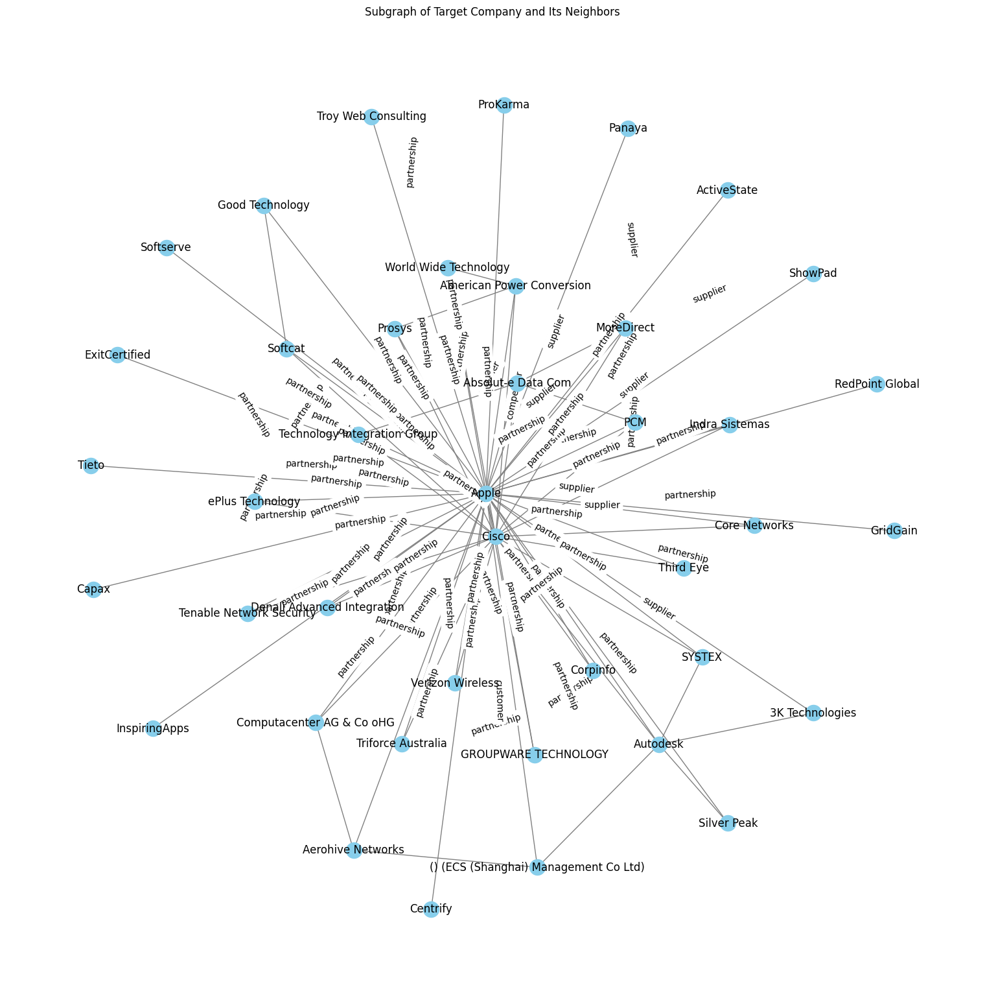

In [ ]:
# plot the two subgraphs
plt.figure(figsize=(15, 15))
nx.draw(subgraphs_selected['Apple'], with_labels=True, node_color="skyblue", edge_color="gray")
# Extract edge labels (in this case, the 'type' property for each edge)
edge_labels = nx.get_edge_attributes(subgraphs_selected['Apple'], 'type')

# Draw edge labels
nx.draw_networkx_edge_labels(subgraphs_selected['Apple'], pos=nx.spring_layout(subgraphs_selected['Apple']), edge_labels=edge_labels)
plt.title("Subgraph of Target Company and Its Neighbors")
plt.show()


# plt.subplot(122)
# plt.title(f"Two degrees of separation from {target_company}")
# pos = nx.spring_layout(subgraph_2)
# nx.draw(subgraph_2, pos, with_labels=True, node_size=3000, font_size=10, font_color='white', node_color='blue')
# plt.axis('off')


In [21]:
# Define a color mapping for each edge type
edge_type_to_color = {
    "partnership": "blue",
    "investment": "green",
    "competitor": "red",
    "supplier": "orange",
    "customer": "purple"
}

def generate_plot_net(company_name):
    # Create a color list for edges based on their 'type' attribute
    edge_colors = [
        edge_type_to_color.get(subgraphs_selected[company_name][u][v]["type"], "gray")  # Default to gray if type not in the mapping
        for u, v in subgraphs_selected[company_name].edges()
    ]

    # Draw the graph with colored edges
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(subgraphs_selected[company_name])  # Store position layout to keep nodes and edges aligned
    nx.draw(subgraphs_selected[company_name], pos, with_labels=True, node_color="skyblue", edge_color=edge_colors, width=2)


    legend_elements = [
        Line2D([0], [0], color=color, lw=2, label=edge_type)
        for edge_type, color in edge_type_to_color.items()
    ]

    # Plot the legend
    plt.legend(handles=legend_elements, title="Edge Types", loc="upper left")
    plt.title(f"Subgraph of {company_name} and Its Neighbors with Edge Type Colors")
    plt.show()

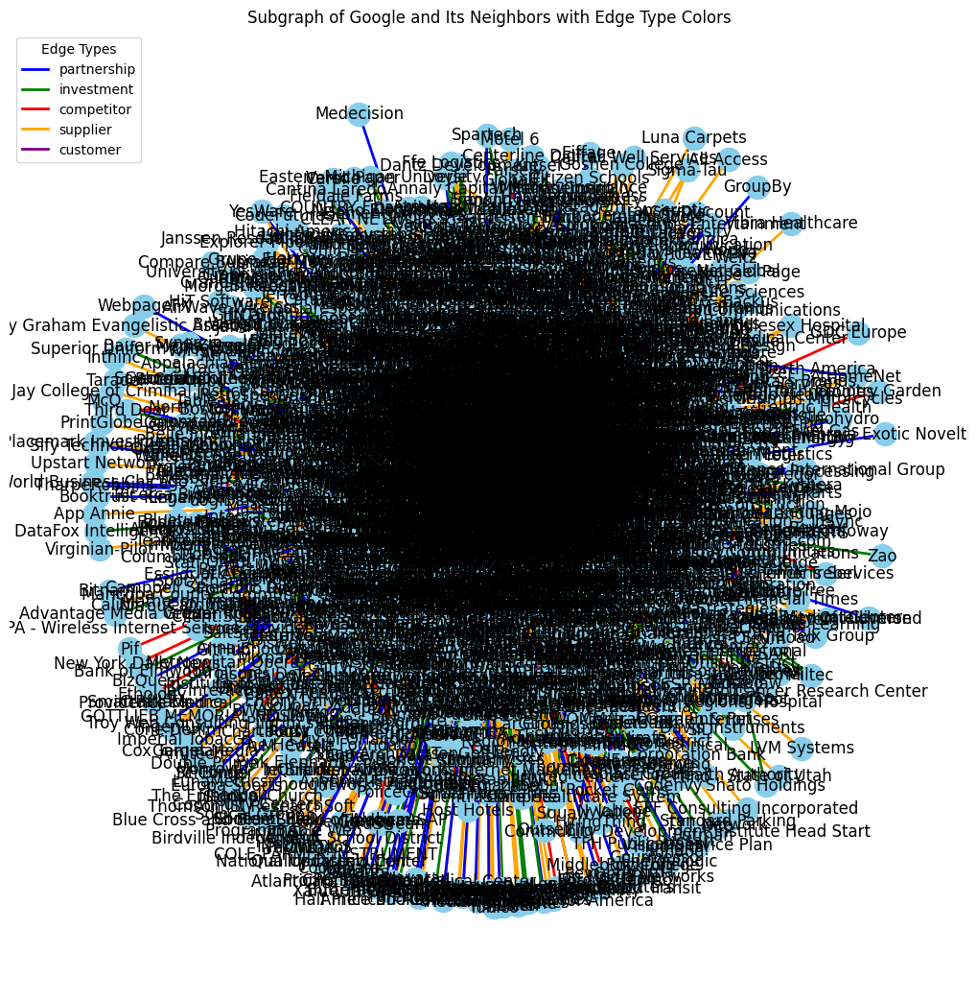

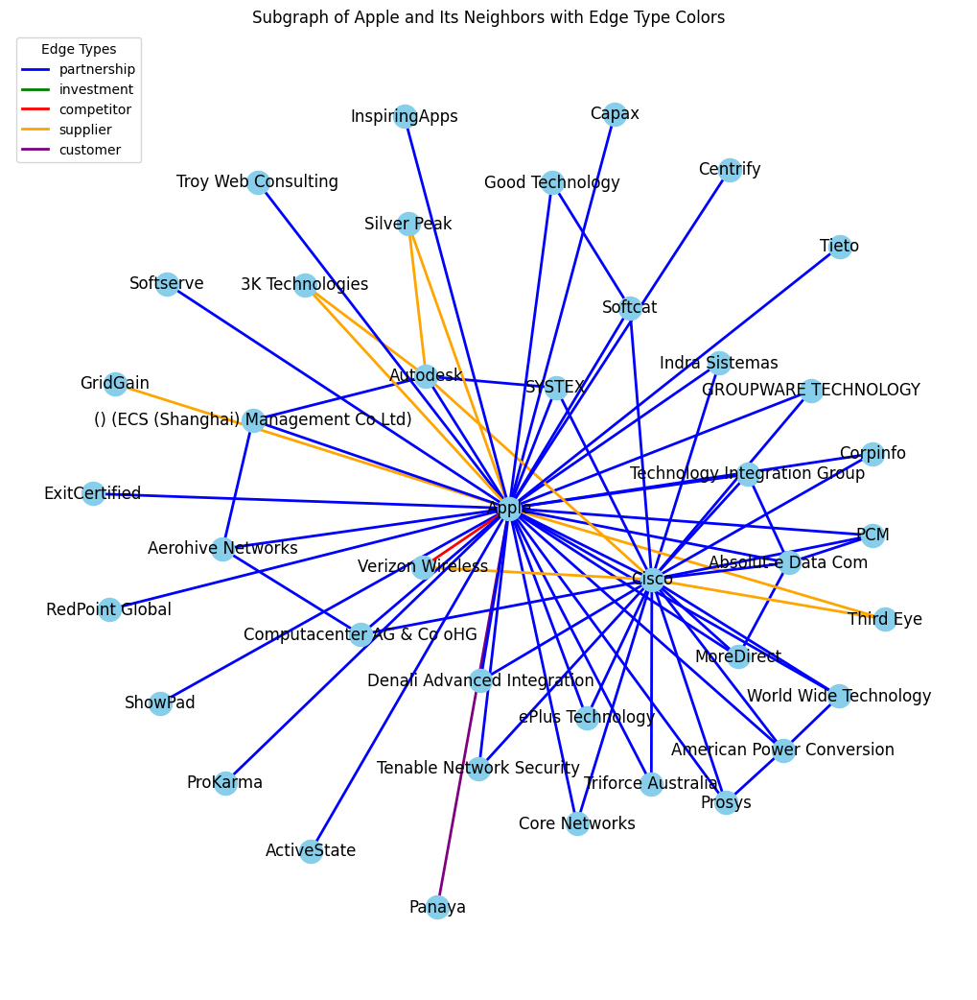

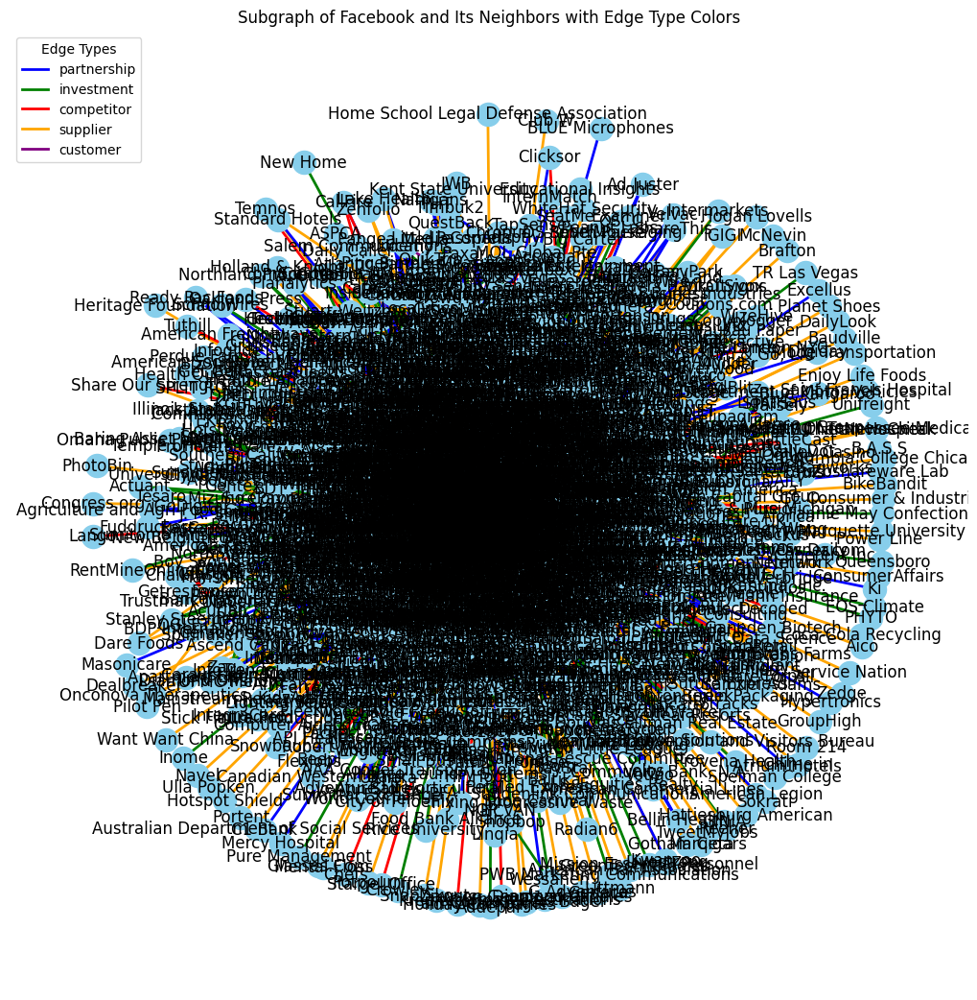

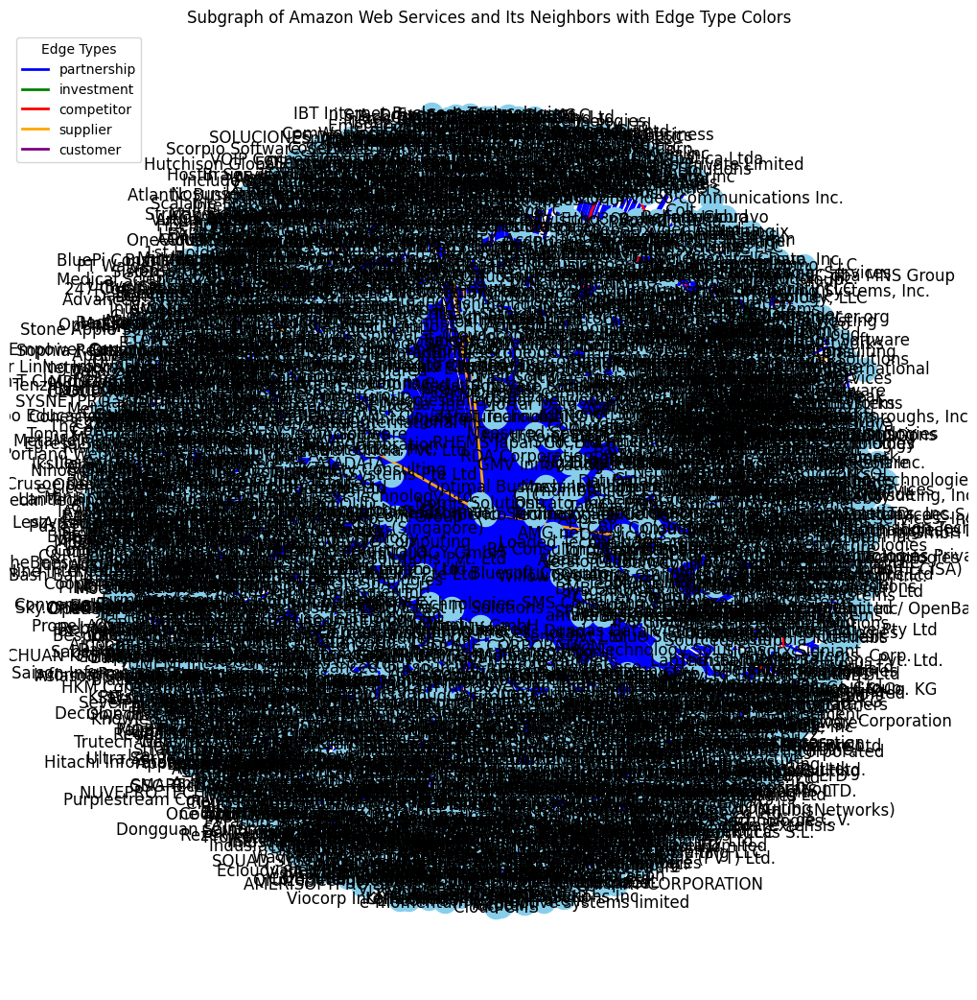

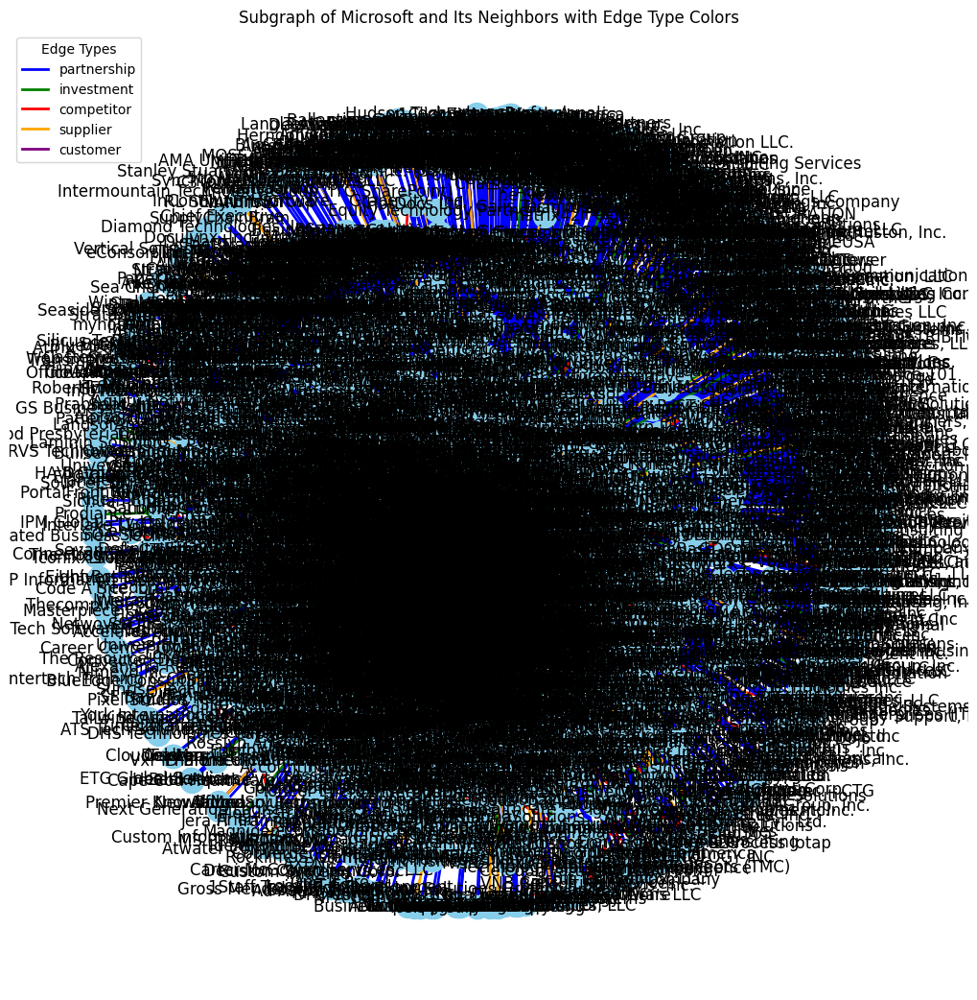

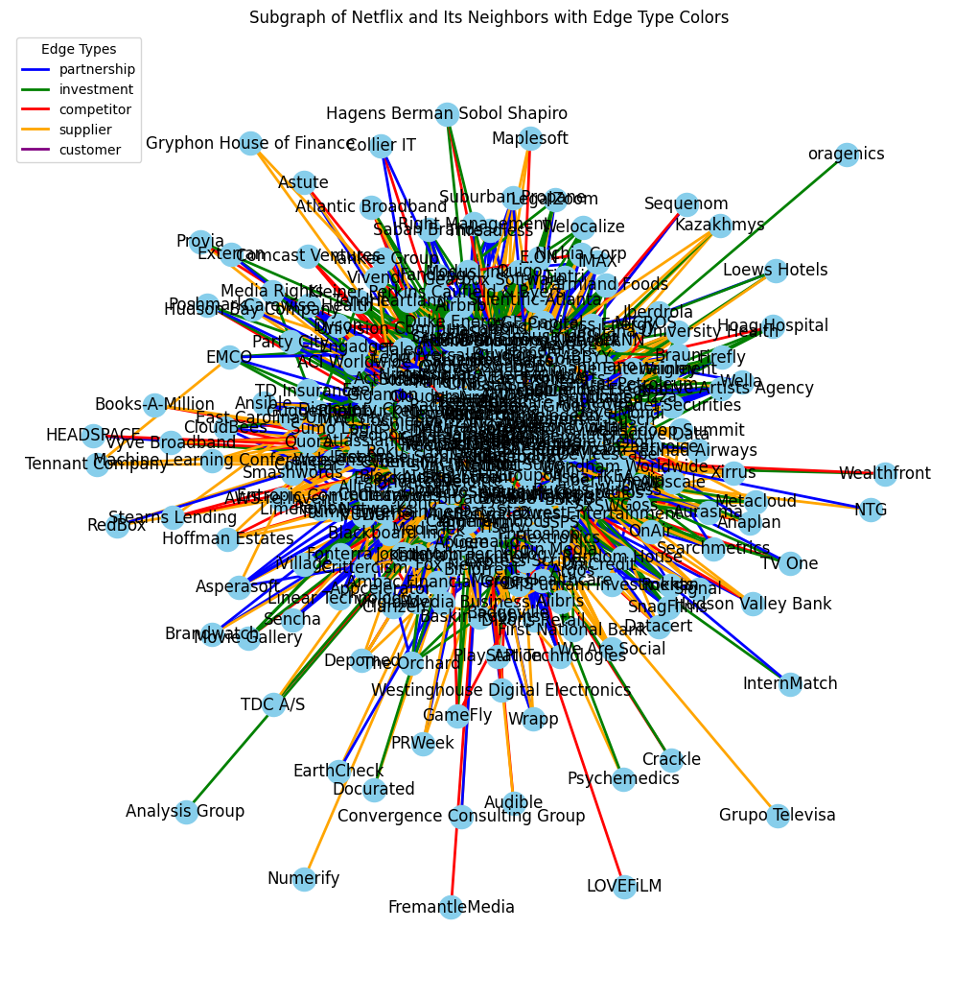

In [23]:
for company in companies_selected_list:
    generate_plot_net(company)

In [55]:
# # create a subgraph of subgraph_1 based on a specific type of link
# subgraph_supplier = nx.Graph()
# for edge in subgraph_1.edges:
#     if subgraph_1.edges[edge]['type'] == 'supplier':
#         subgraph_supplier.add_edge(edge[0], edge[1])

# print(f"Number of nodes in the subgraph: {len(subgraph_supplier.nodes)}")
# print(f"Number of edges in the subgraph: {len(subgraph_supplier.edges)}")

for link in link_list:
    subgraph_type = nx.Graph()
    for edge in subgraph_1.edges:
        if subgraph_1.edges[edge]['type'] == link:
            subgraph_type.add_edge(edge[0], edge[1])

    print(f"nodes {link}: {len(subgraph_type.nodes)}")
    print(f"edges {link}: {len(subgraph_type.edges)}")

nodes partnership: 3879
edges partnership: 20566
nodes customer: 6
edges customer: 4
nodes competitor: 1764
edges competitor: 4066
nodes investment: 2471
edges investment: 16815
nodes nan: 0
edges nan: 0
nodes supplier: 2733
edges supplier: 22930


## ADDITIONAL DATA

In [ ]:
# API KEY 00UZ4D7EYBIWFSCZ

In [75]:
import requests

id_list = ['AAPL', 'GOOGL', 'AMZN', 'MSFT', 'META']

data =  {}
for id in id_list:
    url = f'https://www.alphavantage.co/query?function=OVERVIEW&symbol={id}&apikey=00UZ4D7EYBIWFSCZ'
    r = requests.get(url)
    data[id] = r.json()

print(data)

for c in data:
    print(f"Company: {c}")
    print(f"Description: {data[c]['Description']}")
    print(f"Sector: {data[c]['Sector']}")
    print(f"Industry: {data[c]['Industry']}")

# # replace the "demo" apikey below with your own key from https://www.alphavantage.co/support/#api-key
# url = 'https://www.alphavantage.co/query?function=OVERVIEW&symbol=IBM&apikey=demo'
# r = requests.get(url)
# data = r.json()

# print(data)

{'AAPL': {'Symbol': 'AAPL', 'AssetType': 'Common Stock', 'Name': 'Apple Inc', 'Description': "Apple Inc. is an American multinational technology company that specializes in consumer electronics, computer software, and online services. Apple is the world's largest technology company by revenue (totalling $274.5 billion in 2020) and, since January 2021, the world's most valuable company. As of 2021, Apple is the world's fourth-largest PC vendor by unit sales, and fourth-largest smartphone manufacturer. It is one of the Big Five American information technology companies, along with Amazon, Google, Microsoft, and Facebook.", 'CIK': '320193', 'Exchange': 'NASDAQ', 'Currency': 'USD', 'Country': 'USA', 'Sector': 'TECHNOLOGY', 'Industry': 'ELECTRONIC COMPUTERS', 'Address': 'ONE INFINITE LOOP, CUPERTINO, CA, US', 'OfficialSite': 'https://www.apple.com', 'FiscalYearEnd': 'September', 'LatestQuarter': '2024-09-30', 'MarketCapitalization': '3389415752000', 'EBITDA': '134660997000', 'PERatio': '36.